In [9]:
#@title funcs
import os
import zipfile
import numpy as np
from PIL import Image

def decompress_zip(zip_file, dest_folder, flatten=False):
    # Create the destination folder if it doesn't exist
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)

    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        # Extract all files into the destination folder
        if flatten:
            for file_info in zip_ref.infolist():
                with zip_ref.open(file_info) as file, open(os.path.join(dest_folder, os.path.basename(file_info.filename)), 'wb') as output_file:
                    output_file.write(file.read())
        else:
            zip_ref.extractall(dest_folder)


def maxx(image, max_width=256):
    # Calculate the new height while maintaining the aspect ratio
    aspect_ratio = image.width / image.height
    new_height = int(max_width / aspect_ratio)

    # Resize the image
    image.thumbnail((max_width, new_height))

    return image

palette = np.asarray([
    [0, 0, 0],
    [120, 120, 120],
    [180, 120, 120],
    [6, 230, 230],
    [80, 50, 50],
    [4, 200, 3],
    [120, 120, 80],
    [140, 140, 140],
    [204, 5, 255],
    [230, 230, 230],
    [4, 250, 7],
    [224, 5, 255],
    [235, 255, 7],
    [150, 5, 61],
    [120, 120, 70],
    [8, 255, 51],
    [255, 6, 82],
    [143, 255, 140],
    [204, 255, 4],
    [255, 51, 7],
    [204, 70, 3],
    [0, 102, 200],
    [61, 230, 250],
    [255, 6, 51],
    [11, 102, 255],
    [255, 7, 71],
    [255, 9, 224],
    [9, 7, 230],
    [220, 220, 220],
    [255, 9, 92],
    [112, 9, 255],
    [8, 255, 214],
    [7, 255, 224],
    [255, 184, 6],
    [10, 255, 71],
    [255, 41, 10],
    [7, 255, 255],
    [224, 255, 8],
    [102, 8, 255],
    [255, 61, 6],
    [255, 194, 7],
    [255, 122, 8],
    [0, 255, 20],
    [255, 8, 41],
    [255, 5, 153],
    [6, 51, 255],
    [235, 12, 255],
    [160, 150, 20],
    [0, 163, 255],
    [140, 140, 140],
    [250, 10, 15],
    [20, 255, 0],
    [31, 255, 0],
    [255, 31, 0],
    [255, 224, 0],
    [153, 255, 0],
    [0, 0, 255],
    [255, 71, 0],
    [0, 235, 255],
    [0, 173, 255],
    [31, 0, 255],
    [11, 200, 200],
    [255, 82, 0],
    [0, 255, 245],
    [0, 61, 255],
    [0, 255, 112],
    [0, 255, 133],
    [255, 0, 0],
    [255, 163, 0],
    [255, 102, 0],
    [194, 255, 0],
    [0, 143, 255],
    [51, 255, 0],
    [0, 82, 255],
    [0, 255, 41],
    [0, 255, 173],
    [10, 0, 255],
    [173, 255, 0],
    [0, 255, 153],
    [255, 92, 0],
    [255, 0, 255],
    [255, 0, 245],
    [255, 0, 102],
    [255, 173, 0],
    [255, 0, 20],
    [255, 184, 184],
    [0, 31, 255],
    [0, 255, 61],
    [0, 71, 255],
    [255, 0, 204],
    [0, 255, 194],
    [0, 255, 82],
    [0, 10, 255],
    [0, 112, 255],
    [51, 0, 255],
    [0, 194, 255],
    [0, 122, 255],
    [0, 255, 163],
    [255, 153, 0],
    [0, 255, 10],
    [255, 112, 0],
    [143, 255, 0],
    [82, 0, 255],
    [163, 255, 0],
    [255, 235, 0],
    [8, 184, 170],
    [133, 0, 255],
    [0, 255, 92],
    [184, 0, 255],
    [255, 0, 31],
    [0, 184, 255],
    [0, 214, 255],
    [255, 0, 112],
    [92, 255, 0],
    [0, 224, 255],
    [112, 224, 255],
    [70, 184, 160],
    [163, 0, 255],
    [153, 0, 255],
    [71, 255, 0],
    [255, 0, 163],
    [255, 204, 0],
    [255, 0, 143],
    [0, 255, 235],
    [133, 255, 0],
    [255, 0, 235],
    [245, 0, 255],
    [255, 0, 122],
    [255, 245, 0],
    [10, 190, 212],
    [214, 255, 0],
    [0, 204, 255],
    [20, 0, 255],
    [255, 255, 0],
    [0, 153, 255],
    [0, 41, 255],
    [0, 255, 204],
    [41, 0, 255],
    [41, 255, 0],
    [173, 0, 255],
    [0, 245, 255],
    [71, 0, 255],
    [122, 0, 255],
    [0, 255, 184],
    [0, 92, 255],
    [184, 255, 0],
    [0, 133, 255],
    [255, 214, 0],
    [25, 194, 194],
    [102, 255, 0],
    [92, 0, 255],
])

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import torch
print(f"Torch version: {torch.__version__}")
from transformers import __version__
print(f"Transformers version: {__version__}")

Torch version: 2.1.0+cu121
Transformers version: 4.35.2


## install

In [2]:
!pip install -q git+https://github.com/huggingface/accelerate.git
!pip install -q diffusers

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [4]:
#!pip install xformers==0.0.22.post4 --index-url https://download.pytorch.org/whl/cu118

# Colab CUDA Version: 12.2 🔥 Torch Version: 2.1.0+cu12
!wget --content-disposition https://t.co/9WZvWVGYqR -P /content
!pip install xformers-0.0.22.post7-cp310-cp310-manylinux2014_x86_64.whl

--2024-02-08 22:30:02--  https://t.co/9WZvWVGYqR
Resolving t.co (t.co)... 104.244.42.5
Connecting to t.co (t.co)|104.244.42.5|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://download.pytorch.org/whl/cu121/xformers-0.0.22.post7-cp310-cp310-manylinux2014_x86_64.whl [following]
--2024-02-08 22:30:02--  https://download.pytorch.org/whl/cu121/xformers-0.0.22.post7-cp310-cp310-manylinux2014_x86_64.whl
Resolving download.pytorch.org (download.pytorch.org)... 13.35.35.99, 13.35.35.25, 13.35.35.91, ...
Connecting to download.pytorch.org (download.pytorch.org)|13.35.35.99|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211774478 (202M) [binary/octet-stream]
Saving to: ‘/content/xformers-0.0.22.post7-cp310-cp310-manylinux2014_x86_64.whl’

xformers-0.0.22.pos 100%[===================>] 201.96M   363MB/s    in 0.6s    

2024-02-08 22:30:03 (363 MB/s) - ‘/content/xformers-0.0.22.post7-cp310-cp310-manylinux2014_x86_64.whl’ s

In [6]:
!pip install pytorch_lightning numpy
!pip install -q opencv-contrib-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.3/800.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 12.7 MB/s eta 0:00:00


In [7]:
!pip install -q controlnet_aux
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.4/202.4 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 38.0 MB/s eta 0:00:00


## inference

To process different conditionings depending on the chosen ControlNet, we also need to install some
additional dependencies:
- [OpenCV](https://opencv.org/)
- [controlnet-aux](https://github.com/patrickvonplaten/controlnet_aux#controlnet-auxiliary-models) - a simple collection of pre-processing models for ControlNet

In [10]:
decompress_zip('/content/drive/MyDrive/depth_frames/video1_frames.zip','/content/frames')
decompress_zip('/content/drive/MyDrive/depth_frames/video1_frames_depth.zip','/content/depth')

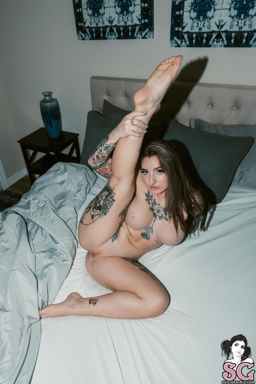

In [8]:
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

image = load_image(
    "https://drive.usercontent.google.com/u/0/uc?id=101f_r2TdeZvW8UYGfxsB1oPKALll5tNP&export=download"
)
maxx(image)

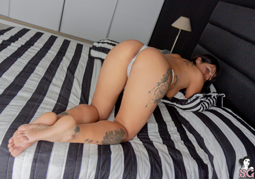

In [10]:
#print("Object attributes:", dir(image))

from PIL import Image

# Specify the file path of the image
image_path = '/content/drive/MyDrive/data/blip2/11.jpg'  # Replace with the actual path to your image file

# Load the image
image = Image.open(image_path)
maxx(image)

Next, we will put the image through the canny pre-processor:

### canny

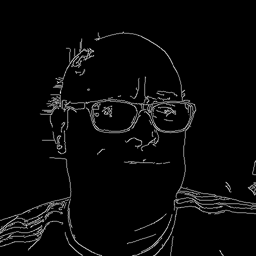

In [19]:
import cv2
from PIL import Image
import numpy as np

image = Image.open('/content/drive/MyDrive/data/steinhaug/512 - kim/kim (1).jpg')
image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
maxx(canny_image)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/20 [00:00<?, ?it/s]

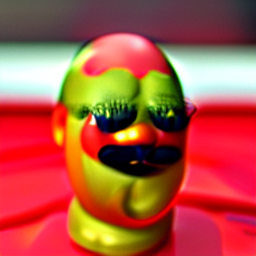

In [22]:
#from diffusers.pipelines.stable_diffusion import safety_checker
#def sc(self, clip_input, images) : return images, [False for i in images]
# edit the StableDiffusionSafetyChecker class so that, when called, it just returns the images and an array of True values
#safety_checker.StableDiffusionSafetyChecker.forward = sc

from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

from diffusers import UniPCMultistepScheduler
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

pipe.enable_model_cpu_offload()
#pipe.safety_checker = lambda images, clip_input: (images, False)

pipe.enable_xformers_memory_efficient_attention()

prompt = "a photo of sks mr potato head, best quality, extremely detailed"
generator = torch.manual_seed(2)
output = pipe(
    prompt,
    canny_image,
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality",
    generator=generator,
    num_inference_steps=20,
)
output.images[0]

### openpose

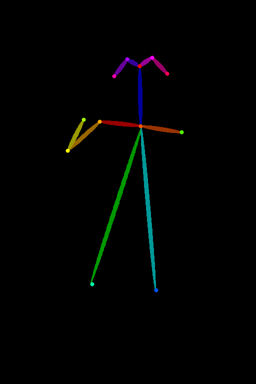

In [29]:
image_path = '/content/drive/MyDrive/data/blip2/17.jpg'
image = Image.open(image_path)

from controlnet_aux import OpenposeDetector

openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(image)
maxx(openpose_image)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

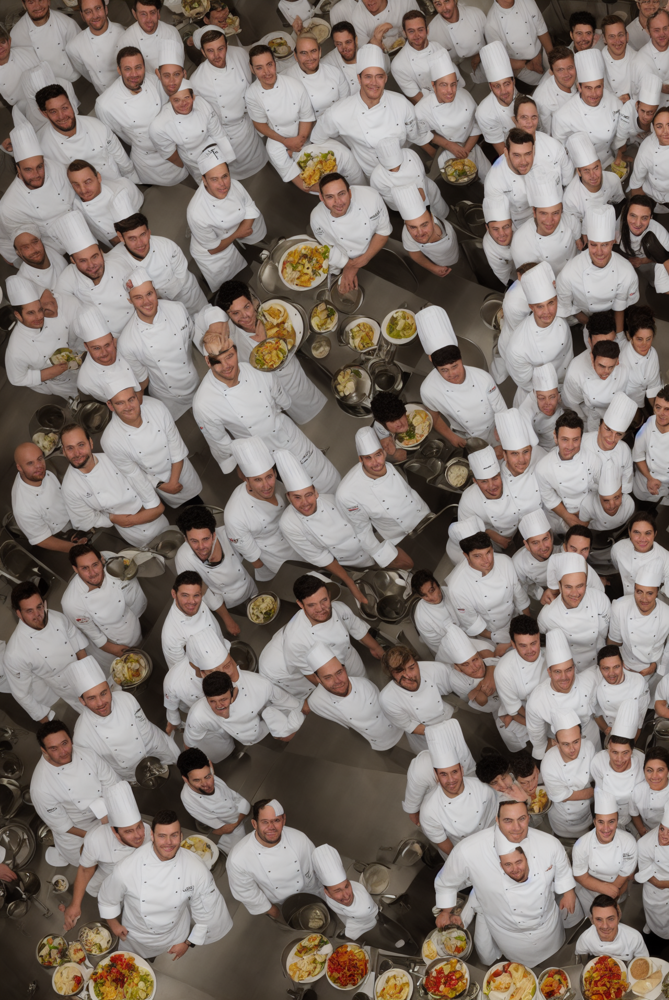

In [30]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()
image = pipe("chef in the kitchen", image, num_inference_steps=20).images[0]
#image.save('images/chef_pose_out.png')
image

### depth

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


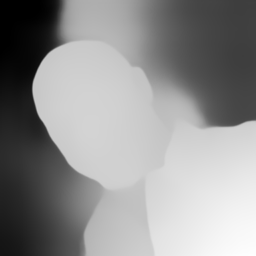

In [37]:
from transformers import pipeline

depth_estimator = pipeline('depth-estimation')

image = Image.open('/content/drive/MyDrive/data/steinhaug/512 - qkimrock/qkimbruce (1).jpg')

image = depth_estimator(image)['depth']
image = np.array(image)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
image = Image.fromarray(image)
maxx(image)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

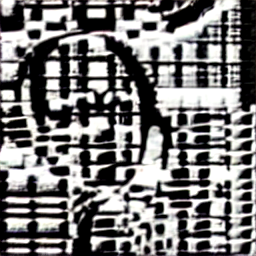

In [41]:
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()
image = pipe("Batman", image, num_inference_steps=20).images[0]
image
#image.save('./images/stormtrooper_depth_out.png')

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

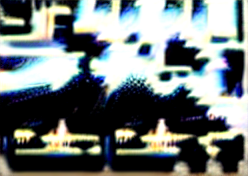

In [36]:
def disabled_safety_checker(images, clip_input):
    if len(images.shape)==4:
        num_images = images.shape[0]
        return images, [False]*num_images
    else:
        return images, False

from diffusers import EulerDiscreteScheduler

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)


pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()
#pipe.safety_checker = disabled_safety_checker

image = pipe("Superman bending over", image, num_inference_steps=20).images[0]
image

### seg

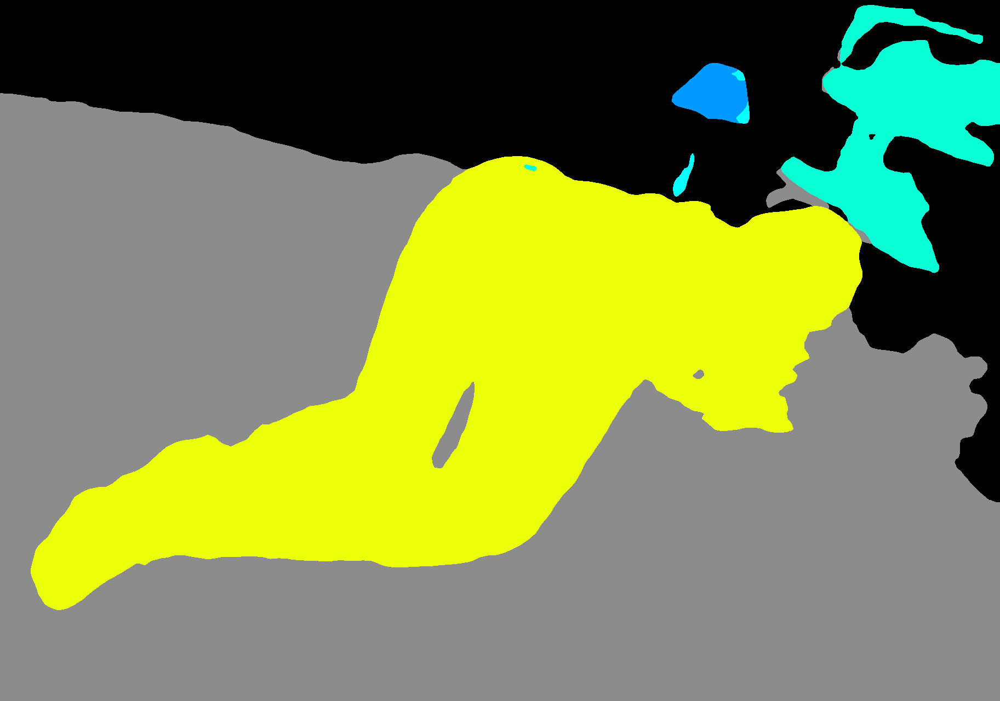

In [24]:
from transformers import AutoImageProcessor, UperNetForSemanticSegmentation

#openmmlab/upernet-convnext-large

image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-small")
image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-small")

image = Image.open('/content/drive/MyDrive/data/blip2/11.jpg').convert('RGB')

pixel_values = image_processor(image, return_tensors="pt").pixel_values

with torch.no_grad():
  outputs = image_segmentor(pixel_values)

seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]

color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_seg[seg == label, :] = color

color_seg = color_seg.astype(np.uint8)

image = Image.fromarray(color_seg)
image

preprocessor_config.json:   0%|          | 0.00/372 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/940M [00:00<?, ?B/s]

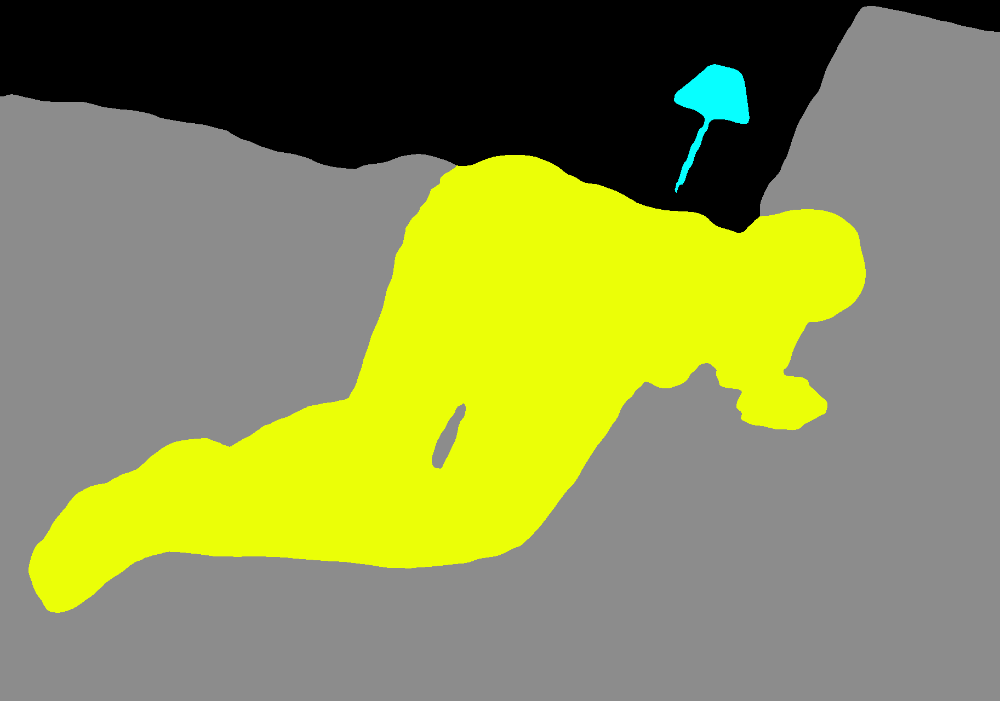

In [25]:
from transformers import AutoImageProcessor, UperNetForSemanticSegmentation

image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-large")
image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-large")

image = Image.open('/content/drive/MyDrive/data/blip2/11.jpg').convert('RGB')

pixel_values = image_processor(image, return_tensors="pt").pixel_values

with torch.no_grad():
  outputs = image_segmentor(pixel_values)

seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]

color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_seg[seg == label, :] = color

color_seg = color_seg.astype(np.uint8)

image = Image.fromarray(color_seg)
image

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-seg", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()

image = pipe("house", image, num_inference_steps=20).images[0]
image
#image.save('/content/seg.png')

### Canny Demo

As we can see, it is essentially edge detection.

Now, we load [runwaylml/stable-diffusion-v1-5](https://huggingface.co/runwayml/stable-diffusion-v1-5) as well as the [ControlNet model for canny edges](https://huggingface.co/lllyasviel/sd-controlnet-canny). The models are loaded in half-precision (`torch.dtype`) to allow for fast and memory-efficient inference.

In [42]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


Instead of using Stable Diffusion's default [PNDMScheduler](https://huggingface.co/docs/diffusers/main/en/api/schedulers/pndm), we use one of the currently fastest
diffusion model schedulers, called [UniPCMultistepScheduler](https://huggingface.co/docs/diffusers/main/en/api/schedulers/unipc).
Choosing an improved scheduler can drastically reduce inference time - in our case we are able to reduce the number of inference steps from 50 to 20 while more or less
keeping the same image generation quality. More information regarding schedulers can be found [here](https://huggingface.co/docs/diffusers/main/en/using-diffusers/schedulers).

In [43]:
from diffusers import UniPCMultistepScheduler

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

Instead of loading our pipeline directly to GPU, we instead enable smart CPU offloading which
can be achieved with the [`enable_model_cpu_offload` function](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/controlnet#diffusers.StableDiffusionControlNetPipeline.enable_model_cpu_offload).

Remember that during inference diffusion models, such as Stable Diffusion require not just one but multiple model components that are run sequentially.
In the case of Stable Diffusion with ControlNet, we first use the CLIP text encoder, then the diffusion model unet and control net, then the VAE decoder and finally run a safety checker.
Most components are only run once during the diffusion process and are thus not required to occupy GPU memory all the time. By enabling smart model offloading, we make sure
that each component is only loaded into GPU when it's needed so that we can significantly save memory consumption without significantly slowing down infenence.

**Note**: When running `enable_model_cpu_offload`, do not manually move the pipeline to GPU with `.to("cuda")` - once CPU offloading is enabled, the pipeline automatically takes care of GPU memory management.

In [44]:
pipe.enable_model_cpu_offload()

Finally, we want to take full advantage of the amazing [FlashAttention/xformers](https://github.com/facebookresearch/xformers) attention layer acceleration, so let's enable this! If this command does not work for you, you might not have `xformers` correctly installed.
In this case, you can just skip the following line of code.

In [45]:
pipe.enable_xformers_memory_efficient_attention()

Now we are ready to run the ControlNet pipeline!

We still provide a prompt to guide the image generation process, just like what we would normally do with a Stable Diffusion image-to-image pipeline. However, ControlNet will allow a lot more control over the generated image because we will be able to control the exact composition in generated image with the canny edge image we just created.

It will be fun to see some images where contemporary celebrities posing for this exact same painting from the 17th century. And it's really easy to do that with ControlNet, all we have to do is to include the names of these celebrities in the prompt!

  0%|          | 0/20 [00:00<?, ?it/s]

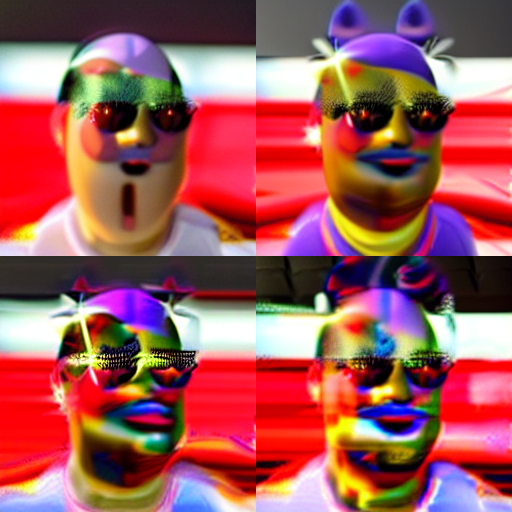

In [46]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["Sandra Oh", "Kim Kardashian", "rihanna", "taylor swift"]]
generator = [torch.Generator(device="cpu").manual_seed(2) for i in range(len(prompt))]

output = pipe(
    prompt,
    canny_image,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * len(prompt),
    generator=generator,
    num_inference_steps=20,
)

image_grid(output.images, 2, 2)

We can effortlessly combine ControlNet combines with fine-tuning too! For example, we can fine-tune a model with [DreamBooth](https://huggingface.co/docs/diffusers/main/en/training/dreambooth), and use it to render ourselves into different scenes.

In this post, we are going to use our beloved Mr Potato Head as an example to show how to use ControlNet with DreamBooth.

We can use the same ContrlNet, however instead of using the Stable Diffusion 1.5, we are going to load the [Mr Potato Head model](https://huggingface.co/sd-dreambooth-library/mr-potato-head) into our pipeline - Mr Potato Head is a Stable Diffusion model fine-tuned with Mr Potato Head concept using Dreambooth 🥔

Let's run the above commands again, keeping the same `controlnet` though!

In [47]:
model_id = "sd-dreambooth-library/mr-potato-head"
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id,
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/546 [00:00<?, ?B/s]

text_encoder/model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/589 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/289 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.67k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/805 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/597 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


Now let's make Mr Potato posing for [Johannes Vermeer](https://en.wikipedia.org/wiki/Johannes_Vermeer)!

In [48]:
generator = torch.manual_seed(2)
prompt = "a photo of sks mr potato head, best quality, extremely detailed"
output = pipe(
    prompt,
    canny_image,
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality",
    generator=generator,
    num_inference_steps=20,
)

  0%|          | 0/20 [00:00<?, ?it/s]

It is noticeable that Mr Potato Head is not the best candidate but he tried his best and did a pretty good job in capture some of the essence 🍟

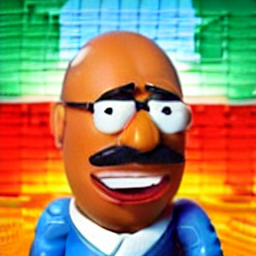

In [49]:
output.images[0]

It is noticeable that Mr Potato Head is not the best candidate but he tried his best and did a pretty good job in capture some of the essence 🍟

Another exclusive application of ControlNet is that we can take a pose from one image and reuse it to generate a different image with the exact same pose. So in this next example, we are going to teach superheroes how to do yoga using [Open Pose ControlNet](https://huggingface.co/lllyasviel/sd-controlnet-openpose)!

First, we will need to get some images of people doing yoga:

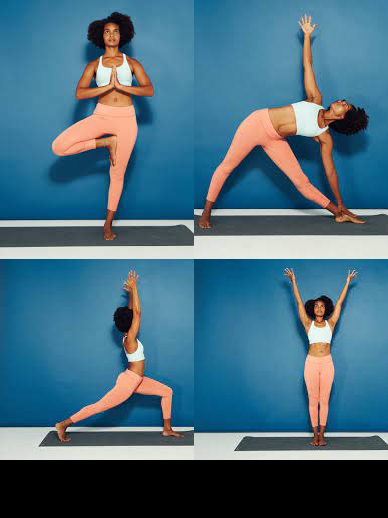

In [50]:
urls = "yoga1.jpeg", "yoga2.jpeg", "yoga3.jpeg", "yoga4.jpeg"
imgs = [
    load_image("https://hf.co/datasets/YiYiXu/controlnet-testing/resolve/main/" + url)
    for url in urls
]

image_grid(imgs, 2, 2)

Now let's extract yoga poses using the OpenPose pre-processors that are handily available via `controlnet_aux`.

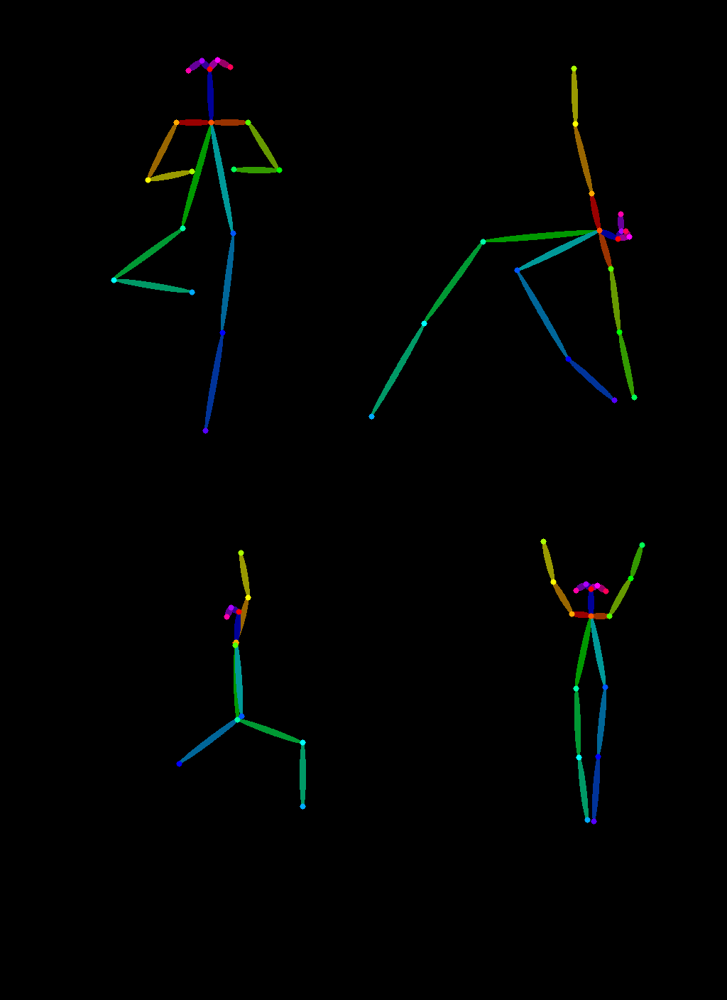

In [51]:
from controlnet_aux import OpenposeDetector

model = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

poses = [model(img) for img in imgs]
image_grid(poses, 2, 2)

To use these yoga poses to generate new images, let's create a [Open Pose ControlNet](https://huggingface.co/lllyasviel/sd-controlnet-openpose). We will generate some super-hero images but in the yoga poses shown above. Let's go 🚀

In [52]:
controlnet = ControlNetModel.from_pretrained(
    "fusing/stable-diffusion-v1-5-controlnet-openpose", torch_dtype=torch.float16
)

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id,
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


Now it's yoga time!

  0%|          | 0/20 [00:00<?, ?it/s]

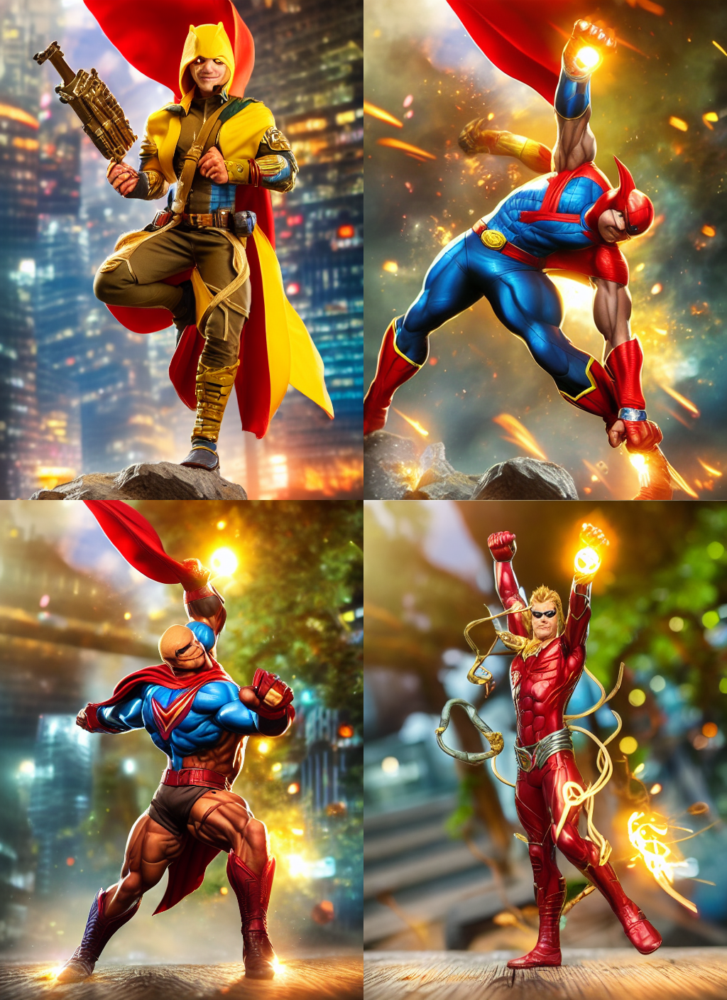

In [53]:
generator = [torch.Generator(device="cpu").manual_seed(2) for i in range(4)]
prompt = "super-hero character, best quality, extremely detailed"
output = pipe(
    [prompt] * 4,
    poses,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * 4,
    generator=generator,
    num_inference_steps=20,
)
image_grid(output.images, 2, 2)